본 글은 애니메이션 캐릭터 얼굴의 엣지를 찾기 위해 다양한 엣지 검출 알고리즘으로 테스트를 수행해본 결과입니다.

### ConvertLineDrawing using conv and maxpool in Pytorch

먼저 Qiita의 koshian2가 제안하는 방법을 사용해 엣지를 검출해 보겠습니다. 전체 코드는 [여기서](https://qiita.com/koshian2/items/f53088d1dedaa72f9dca) 확인하실 수 있고, 유저 wakame1367가 해당 소스 코드를 [캐글 커널](https://www.kaggle.com/wakamezake/convertlinedrawing)로 만들어 공개했습니다. 각 링크에서 더 자세한 정보를 확인하실 수 있습니다.

In [1]:
import numpy as np
from PIL import Image
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

In [2]:
def load_tensor(image_path):
    with Image.open(image_path) as img:
        array = np.asarray(img, np.float32) / 255.0 # [0, 1]
        array = np.expand_dims(array, axis=0)
        array = np.transpose(array, [0, 3, 1, 2]) # pytorch 채널 순서인 NCHW 순서로 transpose
        return torch.as_tensor(array)

def show_tensor(input_image_tensor):
    img = input_image_tensor.numpy() * 255.0
    img = img.astype(np.uint8)[0,0,:,:]    
    plt.imshow(img, cmap="gray")
    plt.show()

def linedraw(image_path):
    # 데이터 로드
    x = load_tensor(image_path)
    # Y = 0.299R + 0.587G + 0.114B를 이용해 Grayscale로 변경
    gray_kernel = torch.as_tensor(
        np.array([0.299, 0.587, 0.114], np.float32).reshape(1, 3, 1, 1))
    x = F.conv2d(x, gray_kernel) 
    dilated = F.max_pool2d(x, kernel_size=3, stride=1, padding=1)
    diff = torch.abs(x-dilated)
    # 반전
    x = 1.0 - diff
    # 결과 보기
    show_tensor(x)

테스트를 위한 이미지를 로드합니다. 경로는 여러분의 환경에 맞도록 바꿔 주세요.

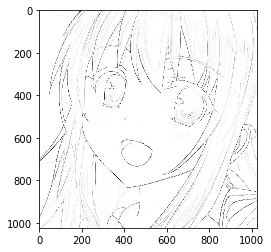

In [3]:
from pathlib import Path
image_path = Path('ExampleImgs/example-1006.jpg')
img = linedraw(image_path)
img

이어서, 엣지 검출을 ①Hard-coded kernel과 ②OpenCV 제공 함수를 이용해 진행해 보겠습니다. 우선 테스트를 위한 이미지를 다시 로드하겠습니다.

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

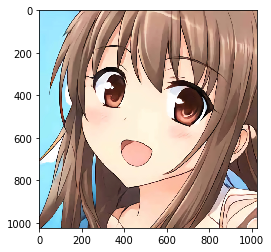

In [5]:
img_path = 'ExampleImgs/example-1006.jpg'
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)

### Basic Gradient Kernel
가장 기본적인 엣지 검출 알고리즘입니다. 엣지 검출을 위해서는 이미지의 픽셀값 변화가 갑자기 커지는 부분을 찾아내야 하며, 연속된 픽셀값에 미분을 수행하면 이 변화량을 구할 수 있습니다. 가장 기본적인 미분은 영상 속 픽셀 데이터를 이산화한 후 X축과 Y축 각각의 방향을 기준으로 다음 픽셀에서 현재 픽셀의 값을 빼는 것입니다. 

아래 코드는 X방향과 Y방향 각각에 대한 미분 마스크를 생성한 후 `cv2.filter2D`로 넘겨 합성곱 연산(Convolution)을 수행합니다. X방향 미분 마스크는 세로 방향에 대한 엣지를 검출하고, Y방향 미분 마스크의 합성곱 결과는 가로 방향의 엣지를 검출합니다. discrete한 근사값으로 얻어낸 미분 결과물이지만 이를 기울기(Gradient)라고 부릅니다. 

결과로 나온 `edge_gx`와 `edge_gy`를 더해 최종 결과물을 얻어 봅시다. 

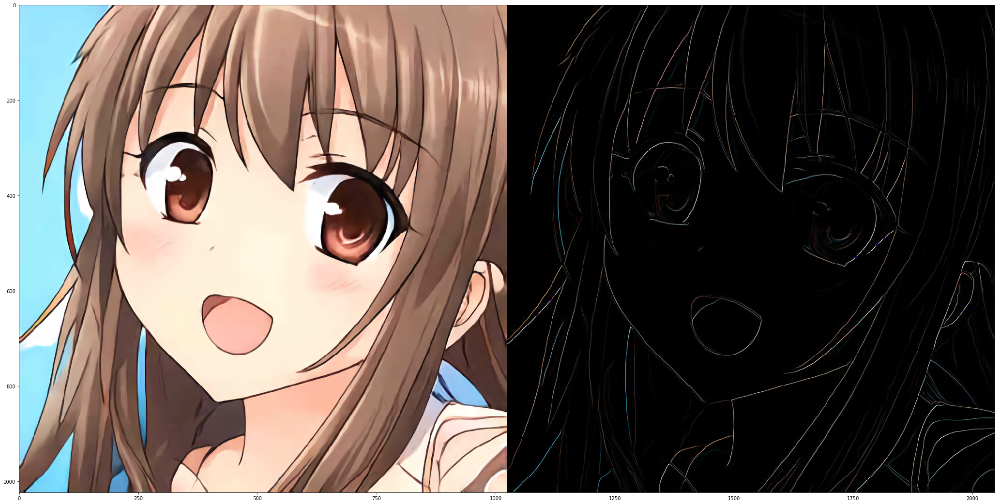

In [6]:
plt.figure(figsize=(60, 20))
left = 0.125
right = 0.7
bottom = 0.2
top = 0.9
wspace = 0.02
hspace = 0.0
plt.subplots_adjust(left=left, right=right, bottom=bottom, top=top, wspace=wspace, hspace=hspace)

# Create gradient kernel
gx_kernel = np.array([[-1,1]])
gy_kernel = np.array([[-1],[1]])

# Apply filter to image
edge_gx = cv2.filter2D(img, -1, gx_kernel)
edge_gy = cv2.filter2D(img, -1, gy_kernel)

# Print results
merged = np.hstack((img, edge_gx+edge_gy))
plt.imshow(merged)

### Roberts Mask
1963년 로렌스 로버츠(Lawrence Roberts)가 기본 미분 커널을 개선해 제안한 커널로, 사선 경계 검출 효과를 높였으나 노이즈에 민감하고 엣지 강도가 약한 단점이 존재합니다. 기본 미분과 비슷하게 두 축에 대해 합성곱 연산을 수행한 결과물을 더해 최종 결과물을 얻어 봅시다. 

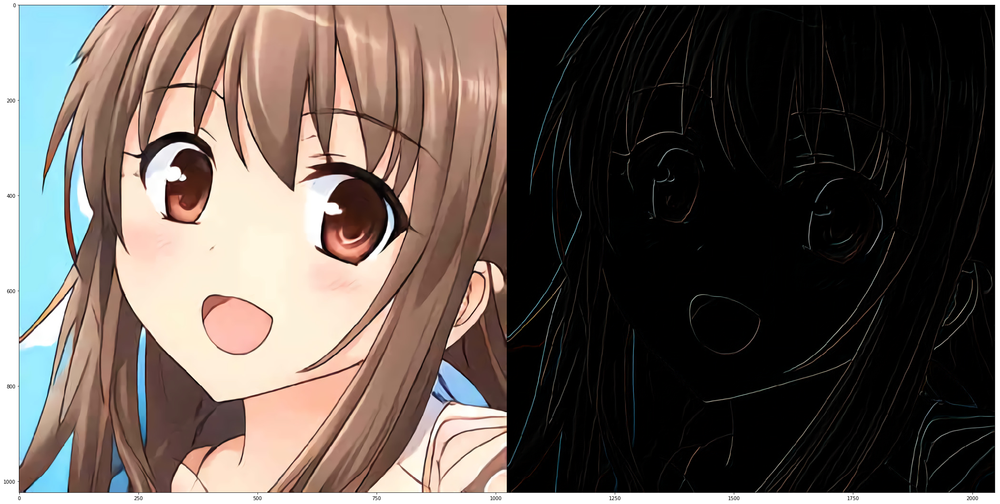

In [7]:
plt.figure(figsize=(60, 20))
left = 0.125
right = 0.7
bottom = 0.2
top = 0.9
wspace = 0.02
hspace = 0.0
plt.subplots_adjust(left=left, right=right, bottom=bottom, top=top, wspace=wspace, hspace=hspace)

# Create Roberts kernel
gx_kernel = np.array([[1,0],[0,-1]])
gy_kernel = np.array([[0,-1],[-1,0]])

# Apply kernel to image
edge_gx = cv2.filter2D(img, -1, gx_kernel)
edge_gy = cv2.filter2D(img, -1, gy_kernel)

# Print results
merged = np.hstack((img, edge_gx+edge_gy))
plt.imshow(merged)

### Prewitt mask
프리윗 마스크는 주디스 프리윗(Judith M. S. Prewitt)이 제안한 마스크로, 각 방향에 대해 차분을 세 번 계산하도록 배치했기 때문에 엣지 강도가 강하게 검출되며, 수직 및 수평 엣지를 동등하게 찾는 장점이 있으나 대각선 검출에 취약한 마스크입니다. 

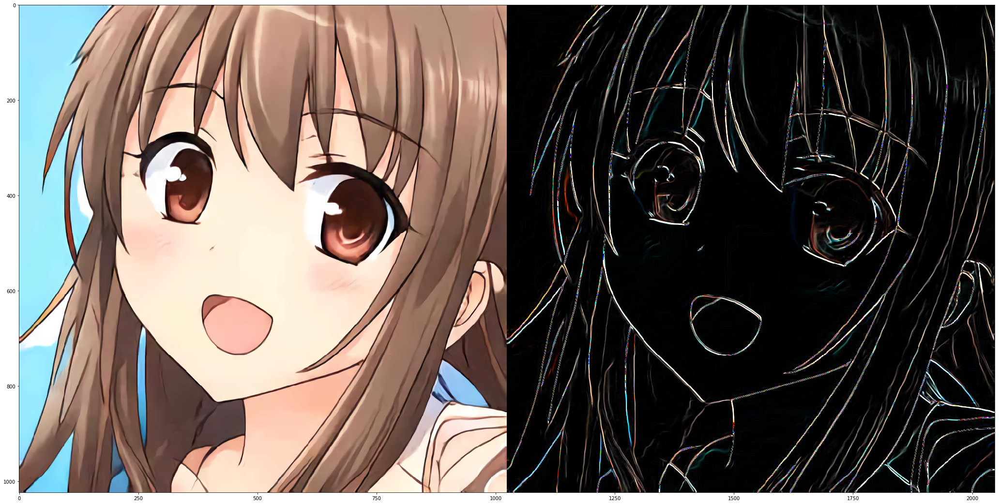

In [8]:
plt.figure(figsize=(60, 20))
left = 0.125
right = 0.7
bottom = 0.2
top = 0.9
wspace = 0.02
hspace = 0.0
plt.subplots_adjust(left=left, right=right, bottom=bottom, top=top, wspace=wspace, hspace=hspace)

# Create Prewitt kernel
gx_kernel = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
gy_kernel = np.array([[-1,-1,-1],[0,0,0],[1,1,1]])

# Apply kernel to image
edge_gx = cv2.filter2D(img, -1, gx_kernel)
edge_gy = cv2.filter2D(img, -1, gy_kernel)

# Print results
merged = np.hstack((img, edge_gx+edge_gy))
plt.imshow(merged)

### Sobel filter
유명한 필터 중 하나인 소벨 필터는 1968년 어원 소벨(Irwin Sobel)이 제안한 필터로, 중심 픽셀의 차분 비중을 두 배로 주어 수평 및 수직 대각선 경계 검출에 모두 강한 마스크입니다. 가장 대표적인 1차 미분 마스크로써, 전용 함수를 OpenCV에서 제공해 줍니다. 

* <i><b>`dst = sv2.Sobel(src, ddepth,dx, dy[, dst, ksize, scale, delta, borderType])`</i></b>
    - <i><b>`src`</i></b> : 입력 이미지(Numpy array)
    - <i><b>`ddepth`</i></b> : 출력 영상의 dtype <i>(-1 : 입력 영상과 동일한 타입)</i>
    - <i><b>`dx, dy`</i></b> : 미분 차수 <i>(0, 1, 2중 선택 가능하며, 둘 다 0일수는 없음.)</i>
    - <i><b>`ksize`</i></b> : 커널의 사이즈 <i>(1, 3, 5, 7중 선택 가능)</i>
    - <i><b>`scale`</i></b> : 미분에 사용할 계수
    - <i><b>`delta`</i></b> : 연산 결과에 더할 가중치

하지만 소벨 필터는 커널의 크기가 작은 경우 또는 커널의 크기가 크더라도 그 중심에서 멀어질수록 엣지 방향의 정확도가 떨어지는 단점이 존재합니다.

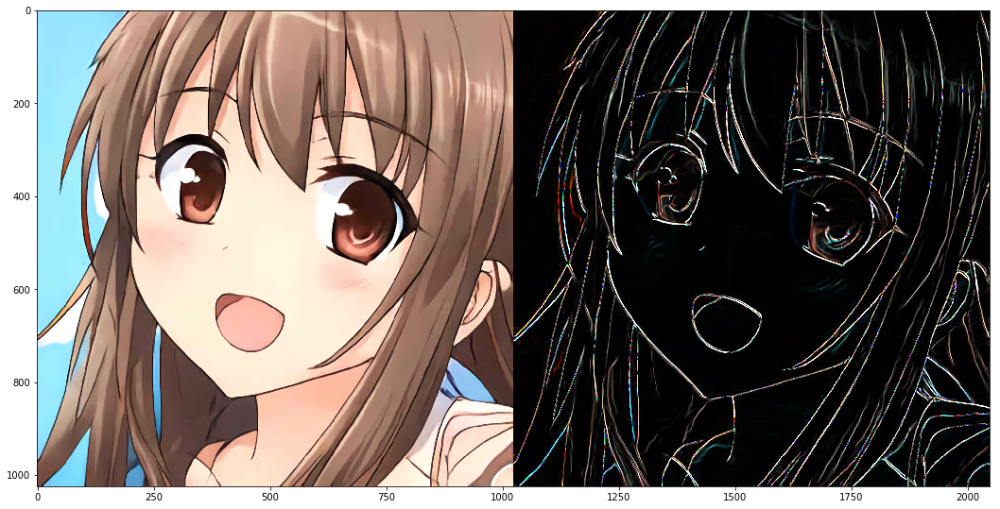

In [9]:
plt.figure(figsize=(60, 20))
left = 0.125
right = 0.7
bottom = 0.2
top = 0.9
wspace = 0.02
hspace = 0.0
plt.subplots_adjust(left=left, right=right, bottom=bottom, top=top, wspace=wspace, hspace=hspace)

# Create Sobel kernel
gx_kernel = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
gy_kernel = np.array([[-1,-2,-1],[0,0,0],[1,2,1]])

# Apply kernel to image
edge_gx = cv2.filter2D(img, -1, gx_kernel)
edge_gy = cv2.filter2D(img, -1, gy_kernel)

# Using Sobel API in OpenCV
sobelx = cv2.Sobel(img, -1, 1, 0, ksize=3)
sobely = cv2.Sobel(img, -1, 0, 1, ksize=3)

# Print results
merged_hardcoded = np.hstack((img, edge_gx+edge_gy))
merged_sobel = np.hstack((img, sobelx+sobely))
# plt.subplot(211)
# plt.imshow(merged_hardcoded)
plt.subplot(212)
plt.imshow(merged_sobel)

### Scharr filter
샤르 필터는 위에서 언급한 소벨 필터의 단점을 개선한 필터입니다.

<i><b>`dst = sv2.Scharr(src, ddepth,dx, dy[, dst, scale, delta, borderType])`</i></b>

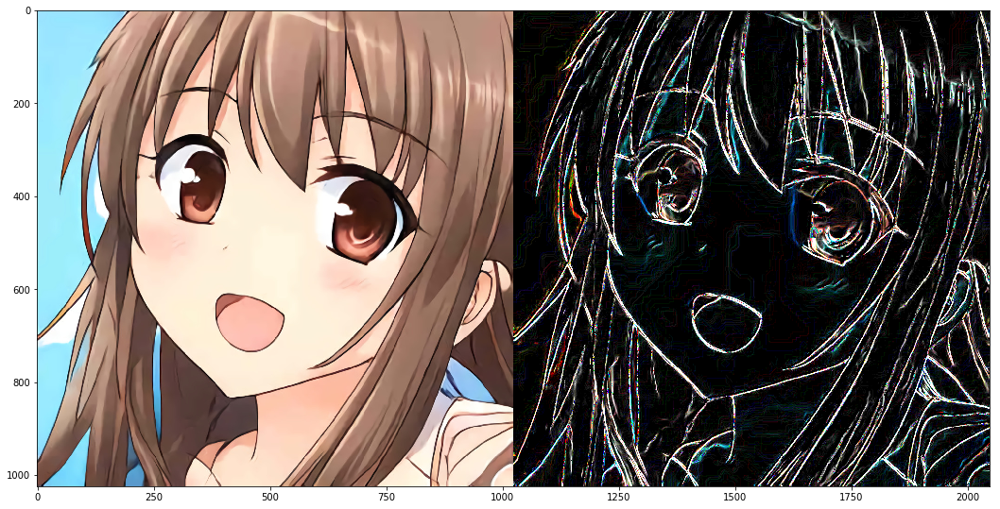

In [10]:
plt.figure(figsize=(60, 20))
left = 0.125
right = 0.7
bottom = 0.2
top = 0.9
wspace = 0.02
hspace = 0.0
plt.subplots_adjust(left=left, right=right, bottom=bottom, top=top, wspace=wspace, hspace=hspace)

# Create Sobel kernel
gx_kernel = np.array([[-3,0,3],[-10,0,10],[-3,0,3]])
gy_kernel = np.array([[-3,-10,-3],[0,0,0],[3,10,3]])

# Apply kernel to image
edge_gx = cv2.filter2D(img, -1, gx_kernel)
edge_gy = cv2.filter2D(img, -1, gy_kernel)

# Using Scharr API in OpenCV
scharrx = cv2.Scharr(img, -1, 1, 0)
scharry = cv2.Scharr(img, -1, 0, 1)

# Print results
# merged_hardcoded = np.hstack((img, edge_gx+edge_gy))
merged_scharr = np.hstack((img, scharrx+scharry))
# plt.subplot(211)
# plt.imshow(merged_hardcoded)
plt.subplot(212)
plt.imshow(merged_scharr)

### Laplacian filter
1차 미분 결과에 대해 다시 한번 미분을 수행하면(2차 미분) 경계를 좀 더 확실히 검출할 수 있습니다. 라플라시안 필터는 대표적인 2차 미분 필터 중 하나로, OpenCV에서는 소벨 필터와 마찬가지로 `cv2.Laplacian()`함수를 제공하고 있습니다.

<i><b>`dst = sv2.Laplacian(src, ddepth[, dst, ksize, scale, delta, borderType])`</i></b>

라플라시안 필터는 노이즈에 민감하기 때문에 가우시안 블러 필터로 어느 정도 노이즈를 경감시키고 적용하는 것이 좋습니다.

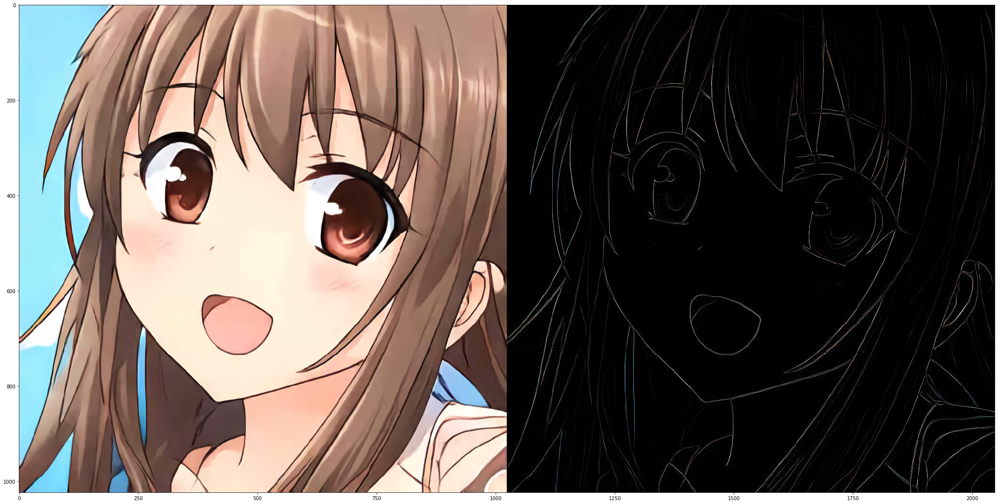

In [11]:
plt.figure(figsize=(60, 20))
left = 0.125
right = 0.7
bottom = 0.2
top = 0.9
wspace = 0.02
hspace = 0.0
plt.subplots_adjust(left=left, right=right, bottom=bottom, top=top, wspace=wspace, hspace=hspace)

# Using Laplacian API in OpenCV
edge = cv2.Laplacian(img, -1)

# Print results
merged = np.hstack((img, edge))
plt.imshow(merged)

### Canny Edge
캐니 엣지 검출기는 1986년 존 캐니(John F. Canny)가 제안한 알고리즘으로, 4단계의 알고리즘을 적용해 잡음에 강한 엣지 검출기입니다. 작동 순서는 아래와 같습니다. 

* 캐니 알고리즘의 작동 순서
    1. 노이즈 제거(Noise Reduction) : 5 X 5 가우시안 블러링 필터로 노이즈 제거
    2. 엣지 그래디언트 방향 계산 : Sobel Mask를 사용해 엣지 및 그래디언트 방향 검출
    3. 비최대치 억제(Non-Maximum Suppression) : 그래디언트 방향에서 검출된 엣지 중 가장 큰 값만 선택하고 나머지는 제거. 
    4. 이력 스레숄딩(Hysteresis Thresholding) : 두 개의 경계값(Max, Min)을 지정한 후 경계 영역에 있는 픽셀들 중 큰 경계값(Max) 밖의 픽셀과 연결성이 없는 픽셀을 제거.
    
OpenCV는 위 알고리즘을 구현한 `cv2.Canny()` 함수를 제공하고 있습니다.

* <i><b>`edges = cv2.Canny(img, threshold1, threshold2[, edges, apertureSize, L2gradient])`</i></b>
    - <i><b>`img`</i></b> : 입력 이미지(Numpy array)
    - <i><b>`threshold1`, `threshold2`</i></b> : Hysteresis Thresholding에 사용할 최소, 최대값
    - <i><b>`apertureSize`</i></b> : Sobel Mask에 사용할 커널 크기
    - <i><b>`L2gradient`</i></b> : 그래디언트 강도를 구할 방식을 지정하는 플래그
        - `True` : L2 Norm 사용
        - `False` : L1 Norm 사용
    - <i><b>`edges`</i></b> : 엣지 결과값을 리턴받을 2차원 배열

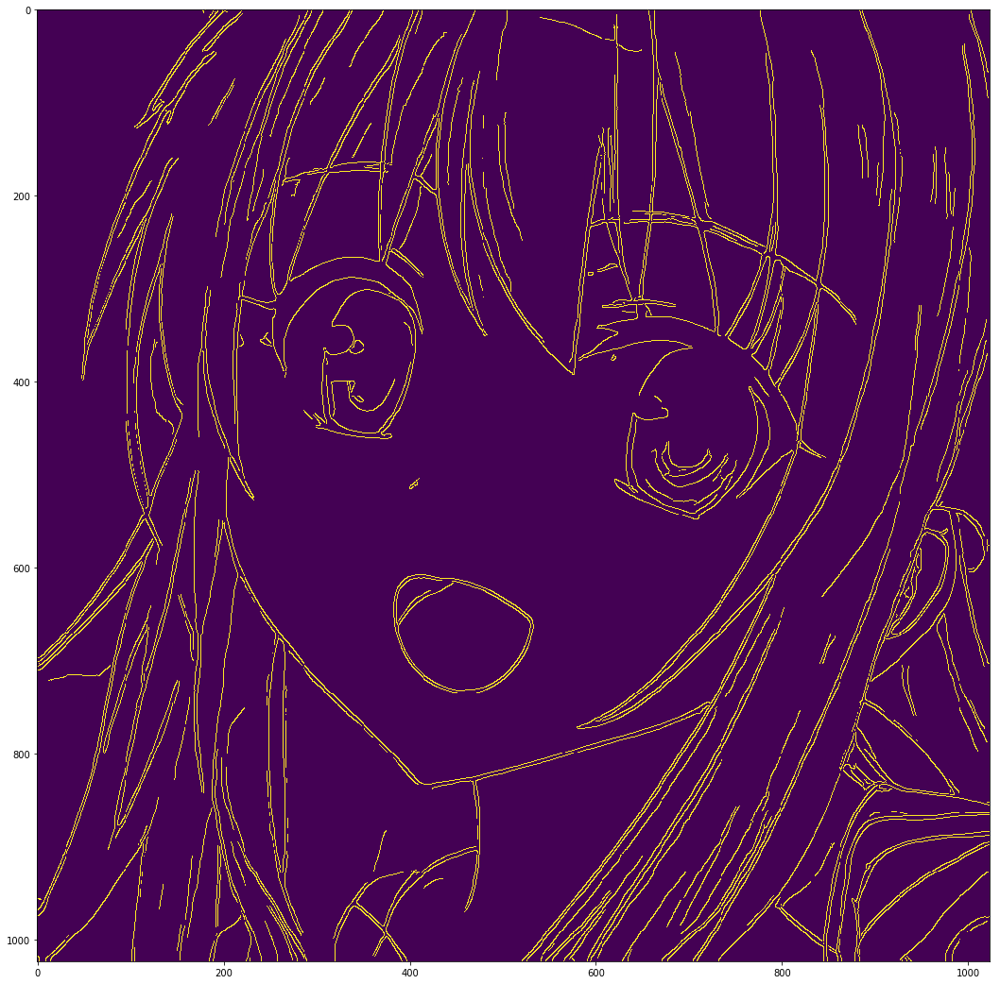

In [12]:
plt.figure(figsize=(60, 20))
left = 0.125
right = 0.7
bottom = 0.2
top = 0.9
wspace = 0.02
hspace = 0.0
plt.subplots_adjust(left=left, right=right, bottom=bottom, top=top, wspace=wspace, hspace=hspace)

# Using Canny API in OpenCV
edges = cv2.Canny(img, 100, 200)

# Print results
plt.imshow(edges)

### Fourier transform 응용
푸리에 트랜스폼은 이미지를 주파수 영역으로 변환한 후 이미지 프로세싱 작업을 수행할 수 있게 해 주며, 주파수 영역에서의 작업이 끝난 후 Inversion Fourier Transform(IFT) 연산을 통해 원래 이미지 영역으로 되돌려 이미지 프로세싱 결과를 확인해 볼 수 있습니다.

이미지는 X, Y 두 방향으로 샘플링되는 이산 신호로 간주할 수 있으며, 이는 즉 푸리에 변환을 X, Y축 두 방향에 대해 수행하면 이미지의 주파수 표현을 얻을 수 있음을 의미합니다. 

사인(sin) 곡선의 경우 짧은 시간에 진폭이 빠르게 변화하면 고주파 신호라고 볼 수 있으며, 천천히 변화하면 저주파 신호로 볼 수 있습니다. 따라서 이미지의 edge(가장자리)와 노이즈는 이미지의 고주파 부분이라고 할 수 있으며, 진폭에 큰 변화가 없으면 저주파 성분으로 볼 수 있습니다.

In [13]:
# Original code from https://blog.naver.com/samsjang/220568857153
import numpy as np
import cv2
import matplotlib.pyplot as plt

def Fourier(image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20*np.log(np.abs(fshift))
    
    rows, cols = image.shape
    print(rows, cols)
    crow, ccol = int(rows/2), int(cols/2)
    
    fshift[crow-30:crow+30, ccol-30:ccol+30]=0
    f_ishift = np.fft.ifftshift(fshift)
    img_back = np.fft.ifft2(f_ishift)
    img_back = np.abs(img_back)
    
    plt.figure(figsize=(30, 30))
    plt.subplot(441)
    plt.imshow(img, cmap='gray')
    plt.title('Original Image', fontsize=40)
    
    plt.subplot(442)
    plt.imshow(img_back, cmap='gray')
    plt.title('After HPF', fontsize=40)
    
    plt.subplot(443)
    plt.imshow(img_back)
    plt.title('Result in JET', fontsize=40)
    
    plt.subplot(444)
    plt.imshow(magnitude_spectrum, cmap = 'gray')
    plt.title('Magnitude Spectrum', fontsize=40)
    
    plt.show() 
    

1024 1024


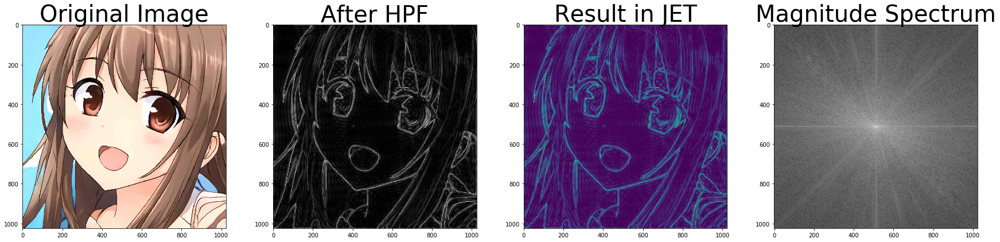

In [14]:
Fourier(img)

감사합니다.